In [1]:
import matplotlib.pyplot as plt
from PIL import Image
import IPython.display as ipd
import os
import numpy as np
import pandas as pd
from datetime import datetime
import time
import random
from tqdm import tqdm
import pickle


#Torch
import torch
import torch.nn as nn
from torch.utils.data import Dataset,DataLoader
from torch.utils.data.sampler import SequentialSampler, RandomSampler
import torchvision
import torchvision.transforms as transforms

#sklearn
from sklearn.model_selection import StratifiedKFold

#CV
import cv2

################# DETR FUCNTIONS FOR LOSS########################
import sys
sys.path.append('./detr/')

from detr.models.matcher import HungarianMatcher
from detr.models.detr import SetCriterion
#################################################################

#Albumenatations
import albumentations as A
import matplotlib.pyplot as plt
from albumentations.pytorch.transforms import ToTensorV2

#Glob
from glob import glob

from iterstrat.ml_stratifiers import MultilabelStratifiedShuffleSplit

In [ ]:
lk_params = dict(winSize = (15,15),
                 maxLevel = 2,
                 criteria = (cv.TERM_CRITERIA_EPS | cv.TERM_CRITERIA_COUNT, 10, 0.03))

## DETR Configs

In [11]:
n_folds = 5
seed = 42
num_classes = 7 #11
num_queries = 65 #changed from 100
null_class_coef = 0.5
BATCH_SIZE = 8
LR = 2e-5
EPOCHS = 2
device = torch.device('cuda')

## Data Setup

In [57]:
df = pd.read_csv('mot_labels.csv')
df['x'] = df['box2d.x1']
df['y'] = df['box2d.y1']
df['w'] = df['box2d.x2'] - df['box2d.x1']
df['h'] = df['box2d.y2'] - df['box2d.y1']
df['x_center'] = (df['box2d.x1'] + df['box2d.x2'])/2
df['y_center'] = (df['box2d.y1'] + df['box2d.y2'])/2
df = df[df['haveVideo'] == True].copy()
df.dropna(inplace=True)

def relabel(x):
    if x in ['pedestrian', 'rider', 'other person']:
        return 'person'
    return x

jpegs = os.listdir('frames_v2')
df_cleaned = df[df['name'].isin(jpegs)].copy()
df_cleaned = df_cleaned[~df_cleaned['category'].isin(['trailer', 'other vehicle'])]
df_cleaned['category'] = df_cleaned['category'].apply(lambda x: relabel(x))

In [58]:
# X_train_df = pd.read_csv('train_videos_small.csv', header = None, index_col = 0)
X_test_df = pd.read_csv('test_videos_small.csv', header = None, index_col = 0)

# X_train_list = list(X_train_df[1])
X_test_list = list(X_test_df[1])

# len(X_train_list), len(X_test_list)
len(X_test_list)

20

In [59]:
# train_df = df_cleaned[df_cleaned['videoName'].isin(X_train_list)].copy()
test_df = df_cleaned[df_cleaned['videoName'].isin(X_test_list)].copy()

## Data Formatting for DETR

In [17]:
def get_valid_transforms():
    return A.Compose([A.Resize(height=512, width=512, p=0),
                      ToTensorV2(p=1.0)],
                      p=1.0,
                      bbox_params=A.BboxParams(format='coco',min_area=0, min_visibility=0,label_fields=['labels'])
                      )

In [63]:
DIR_TRAIN = 'frames_v2'

class DrivingDataset(Dataset):
    def __init__(self,image_ids,dataframe,transforms=None):
        self.image_ids = image_ids
        self.df = dataframe
        self.transforms = transforms
        self.label_map = {'car': 0,
                   'person': 1,
                   'truck': 2,
                   'bus': 3,
                   'bicycle': 4,
                   'motorcycle': 5,
                   'train': 6}

    def __len__(self) -> int:
        return self.image_ids.shape[0]

    def __getitem__(self,index):
        image_id = self.image_ids[index]
        records = self.df[self.df['name'] == image_id]

        image = cv2.imread(f'{DIR_TRAIN}/{image_id}', cv2.IMREAD_COLOR).astype(np.float32)
#         image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image /= 255.0

        # DETR takes in data in coco format
        #boxes = records[['x', 'y', 'w', 'h']].values
        boxes = records[['x_center', 'y_center', 'w', 'h']].values

        #Area of bb
        area = boxes[:,2]*boxes[:,3]
        area = torch.as_tensor(area, dtype=torch.float32)

        # AS pointed out by PRVI It works better if the main class is labelled as zero
        labels = records['category'].values
        labels =  np.array([self.label_map[label] for label in labels], dtype=np.int32)


        if self.transforms:
            sample = {
                'image': image,
                'bboxes': boxes,
                'labels': labels
            }
            sample = self.transforms(**sample)
            image = sample['image']
            boxes = sample['bboxes']
            labels = sample['labels']


        #Normalizing BBOXES

        _,h,w = image.shape
        boxes = A.core.bbox_utils.normalize_bboxes(sample['bboxes'],rows=h,cols=w)
        target = {}
        target['boxes'] = torch.as_tensor(boxes,dtype=torch.float32)
        target['labels'] = torch.as_tensor(labels,dtype=torch.long)
        target['image_id'] = torch.tensor([index])
        target['area'] = area

        return image, target, image_id

In [8]:
def collate_fn(batch):
    return tuple(zip(*batch))

## Model Definition

In [9]:
class DETRModel(nn.Module):
    def __init__(self,num_classes,num_queries):
        super(DETRModel,self).__init__()
        self.num_classes = num_classes
        self.num_queries = num_queries

        self.model = torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained=True)
        self.in_features = self.model.class_embed.in_features

        self.model.class_embed = nn.Linear(in_features=self.in_features,out_features=self.num_classes)
        self.model.num_queries = self.num_queries

    def forward(self,images):
        return self.model(images)

## Model Import

In [127]:
matcher = HungarianMatcher()

weight_dict = weight_dict = {'loss_ce': 1, 'loss_bbox': 1 , 'loss_giou': 1}

losses = ['labels', 'boxes', 'cardinality']

In [128]:
device = torch.device("cuda")
model = DETRModel(num_classes=num_classes,num_queries=num_queries)
model.load_state_dict(torch.load('detr_parameters.pth'))
model.to(device)

criterion = SetCriterion(num_classes-1, matcher, weight_dict, eos_coef = null_class_coef, losses=losses) #changed from num_classes-1 to num_classes
criterion = criterion.to(device)

Using cache found in /home/ubuntu/.cache/torch/hub/facebookresearch_detr_master


## Figuring out how to combine model with optic flow

In [133]:
# Returns Loss and Boxes predicted over 0.4
def get_DETR_pred(image, target, image_id, model, criterion, device):
    model.eval()
    criterion.eval()
    summary_loss = 0
    
    with torch.no_grad():

        image = [image.to(device)]
        target =  [{k: v.to(device) for k, v in target.items()}]
        output = model(image)

        loss_dict = criterion(output, target)
        weight_dict = criterion.weight_dict

        losses = sum(loss_dict[k] * weight_dict[k] for k in loss_dict.keys() if k in weight_dict)

        summary_loss = losses.item()

        torch.cuda.empty_cache()
        del loss_dict, losses
      
    _,h,w = image[0].shape
    oboxes = output['pred_boxes'][0].detach().cpu().numpy()
    oboxes = [np.array(box).astype(np.int32) for box in A.core.bbox_utils.denormalize_bboxes(oboxes,h,w)]
    logits = output['pred_logits'][0].detach().cpu().numpy()
    
    output_boxes = []
    
    for box, logit in zip(oboxes, logits):
        prob = torch.softmax(torch.from_numpy(logit), dim=0).numpy()
        class_idx = np.argmax(prob[:-1])  # Exclude the last class (no-object)
        p = prob[class_idx]
        
        if p > 0.4: 
            output_boxes.append(box)
    
    return summary_loss, output_boxes

In [ ]:
def get_YOLO_pred(image, target, image_id, model, criterion, device):
    # TODO
    return loss, ouptut

In [165]:
#OPTIC FLOW METHODS
def get_points_from_boxes(boxes):
    points = []
    box_id = 0
    for box in boxes:
        cx, cy, w, h = box
        x_min = cx - w / 2
        y_min = cy - h / 2
        x_max = cx + w / 2
        y_max = cy + h / 2

        center = (cx, cy)
        top_left = (x_min, y_min)
        top_right = (x_max, y_min)
        bottom_left = (x_min, y_max)
        bottom_right = (x_max, y_max)

        # Append points along with their box ID
        points.extend([(center, box_id), (top_left, box_id), (top_right, box_id), (bottom_left, box_id), (bottom_right, box_id)])
        box_id += 1

    return points


def reconstruct_boxes(tracked_points):
    boxes = []
    # Group points by box ID
    box_points = {}
    for point, box_id in tracked_points:
        if box_id not in box_points:
            box_points[box_id] = []
        box_points[box_id].append(point)
    
    # Reconstruct boxes from grouped points
    for points in box_points.values():
        # Assuming points contains all 5 points (center, 4 corners) for each box
        xs = [p[0] for p in points]
        ys = [p[1] for p in points]
        x = min(xs)
        y = min(ys)
        w = max(xs) - x
        h = max(ys) - y
        boxes.append([x+(w/2), y+(h/2), w, h])
#         boxes.append([x, y, w, h])

    return boxes

def convert_normalized_boxes(boxes, img_width, img_height):
    converted_boxes = []
    for box in boxes:
        x_center, y_center, width, height = box
        x_center_pixel = x_center * img_width
        y_center_pixel = y_center * img_height
        width_pixel = width * img_width
        height_pixel = height * img_height
        converted_boxes.append([x_center_pixel, y_center_pixel, width_pixel, height_pixel])
    return converted_boxes

def normalize_boxes(boxes, img_width, img_height):
    normalized_boxes = []
    for box in boxes:
        cx, cy, w, h = box
        cx_normalized = cx / img_width
        cy_normalized = cy / img_height
        w_normalized = w / img_width
        h_normalized = h / img_height
        normalized_boxes.append([cx_normalized, cy_normalized, w_normalized, h_normalized])
    return normalized_boxes

def get_OF_pred(prev_boxes, prev_img, curr_img, lk_params):
    # Extract points and their IDs from the previous bounding boxes
    prev_points_with_ids = get_points_from_boxes(prev_boxes)
    prev_points = np.array([pt for pt, _ in prev_points_with_ids], dtype=np.float32)

    # Convert images to grayscale for optical flow
    prev_gray = cv2.cvtColor(prev_img, cv2.COLOR_BGR2GRAY)
    curr_gray = cv2.cvtColor(curr_img, cv2.COLOR_BGR2GRAY)

    # Calculate optical flow to track points
    curr_points, status, _ = cv2.calcOpticalFlowPyrLK(prev_gray, curr_gray, prev_points, None, **lk_params)
    status_flat = status.flatten()

    # Filter points and IDs based on the status
    good_points_with_ids = [(curr_points[i], id) for i, (_, id) in enumerate(prev_points_with_ids) if status_flat[i]]

    # Reconstruct bounding boxes from filtered points and IDs
    new_boxes = reconstruct_boxes(good_points_with_ids)

    loss = None  # Placeholder for loss calculation

    return loss, new_boxes

def draw_boxes(img, boxes, color, label):
    for box in boxes:
        cx, cy, w, h = box  # center_x, center_y, width, height
        x_min = int((cx - w / 2) * img.shape[1])
        y_min = int((cy - h / 2) * img.shape[0])
        x_max = int((cx + w / 2) * img.shape[1])
        y_max = int((cy + h / 2) * img.shape[0])
        cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color, 2)
        cv2.putText(img, label, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
    return img

def plot_boxes(img, of_box, model_box, frame_idx):
    img_width, img_heigh = 1280, 720
    
    model_box_norm = normalize_boxes(model_box, img_width, img_height)
    img_with_boxes = draw_boxes(img.copy(), model_box_norm, (0, 255, 0), "Model")

    of_box_norm = normalize_boxes(of_box, img_width, img_height)
    img_with_boxes = draw_boxes(img_with_boxes, of_box_norm, (0, 0, 255), "OF")
    

    # Visualize
    plt.figure(figsize=(15, 15))
    plt.imshow(cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB))
    plt.title(f"Frame {frame_idx} with Actual and Predicted Boxes")
    plt.axis("off")
    plt.show()

In [166]:
def box_iou(box1, box2):
    # Calculate the (x, y)-coordinates of the intersection rectangle
    xA = max(box1[0] - box1[2] / 2, box2[0] - box2[2] / 2)
    yA = max(box1[1] - box1[3] / 2, box2[1] - box2[3] / 2)
    xB = min(box1[0] + box1[2] / 2, box2[0] + box2[2] / 2)
    yB = min(box1[1] + box1[3] / 2, box2[1] + box2[3] / 2)

    # Compute the area of intersection
    interArea = max(0, xB - xA) * max(0, yB - yA)

    # Compute the area of both bounding boxes
    box1Area = box1[2] * box1[3]
    box2Area = box2[2] * box2[3]

    # Compute the intersection over union
    iou = interArea / float(box1Area + box2Area - interArea)
    return iou

def compare_outputs(optic_flow_boxes, model_boxes):
    # Assuming both sets of boxes are in the format [center_x, center_y, width, height]
    # and that they are aligned (each box in one list corresponds to the box at the same index in the other list)
    ious = [box_iou(of_box, model_box) for of_box, model_box in zip(optic_flow_boxes, model_boxes)]
    avg_iou = sum(ious) / len(ious) if ious else 0
    return avg_iou

In [170]:
# model vs optic flow on ONE video
def model_vs_of(dataset, model, criterion, device, lk_params, model_type = 'DETR', threshold = 0.75, show_results = False):
    num_frames = len(dataset)
    
    padding = 1
    last_model_idx = 0
    
    if model_type == 'DETR':
        predictor = get_DETR_pred
    else:
        predictor = get_YOLO_pred
        
    img_width, img_heigh = 1280, 720
    
    model_frame_losses = np.zeros(num_frames)
    of_frame_losses = np.zeros(num_frames)
    total_frame_losses = np.zeros(num_frames)
    
    model_used = np.zeros(num_frames, dtype=bool)
    
    avg_running_loss = 0
    
    for i, (img, target, img_id) in enumerate(dataset):
        
        image_np = img.numpy().transpose(1, 2, 0)  # Convert from PyTorch tensor to NumPy array and change from CxHxW to HxWxC
        image_np = (image_np * 255).astype(np.uint8)  # Convert from [0, 1] to [0, 255]
        image_bgr = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)
        
        if i == 0:
            model_loss, model_output = predictor(img, target, img_id, model, criterion, device) 
#             model_boxes = convert_normalized_boxes(model_output, img_width, img_height)
            model_boxes = model_output
            
            prev_output = model_boxes
            prev_img = image_bgr
            
            model_frame_losses[i] = model_loss
            total_frame_losses[i] = model_loss
            model_used[i] = True
            
        else:
            of_loss, of_output = get_OF_pred(prev_output, prev_img, image_bgr, lk_params) 
            of_frame_losses[i] = of_loss
            
            if last_model_idx + padding == i:
                model_loss, model_output = predictor(img, target, img_id, model, criterion, device) # TODO check inputs once written
#                 model_boxes = convert_normalized_boxes(model_output, img_width, img_height)
                model_boxes = model_output
                
                model_frame_losses[i] = model_loss
                total_frame_losses[i] = model_loss
                model_used[i] = True
                
                last_model_idx = i
                
                prev_output = model_boxes # here we assume that the model is "always right"
                
                box_diff = compare_outputs(of_output, model_boxes) # [0,1] range output - 1 is exact match
                
                if show_results:
                    print(i)
                    print(model_boxes)
                    print(of_output)
                    print(box_diff)
                    plot_boxes(image_bgr, of_output, model_boxes, i)
                
                if box_diff < threshold: # bad optic flow results
                    padding = 1
                else: # good optic flow results, continue to pad
                    padding += 1
            
            else:
                prev_output = of_output 
                total_frame_losses[i] = of_loss
            
            prev_img = image_bgr
            
#         if i > 30:
#             break
            
    return total_frame_losses

In [171]:
video = X_test_list[0]
one_video_sample_df = test_df[test_df['videoName'] == video]
one_vid_dataset = DrivingDataset(image_ids=one_video_sample_df.name.values, 
                               dataframe=one_video_sample_df, 
                               transforms=get_valid_transforms())

1
[array([423, 435,  81,  63], dtype=int32), array([514, 437,  30,  24], dtype=int32)]
[[423.0, 435.0, 81.0, 63.0], [514.0, 437.0, 30.0, 24.0]]
1.0


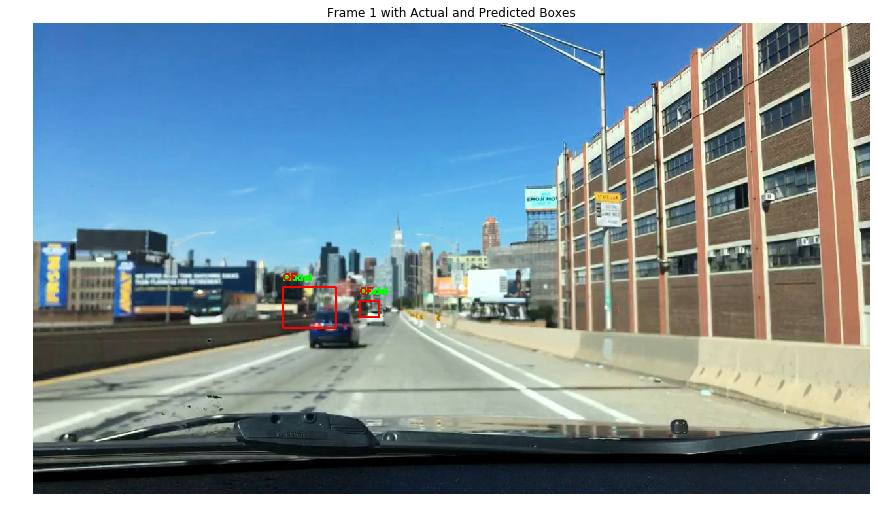

3
[array([423, 435,  81,  63], dtype=int32), array([514, 437,  30,  24], dtype=int32)]
[[423.0, 435.0, 81.0, 63.0], [514.0, 437.0, 30.0, 24.0]]
1.0


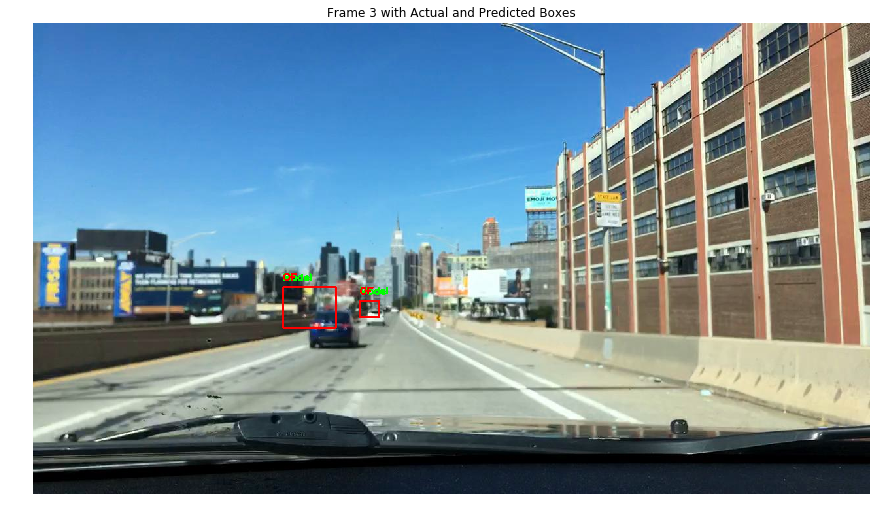

6
[array([516, 435,  34,  24], dtype=int32), array([543, 426,  24,  19], dtype=int32), array([432, 431,  74,  61], dtype=int32)]
[[418.8814239501953, 430.461181640625, 101.68594, 67.81079], [517.3910217285156, 432.2304992675781, 30.847961, 23.273926]]
0.011794976449086909


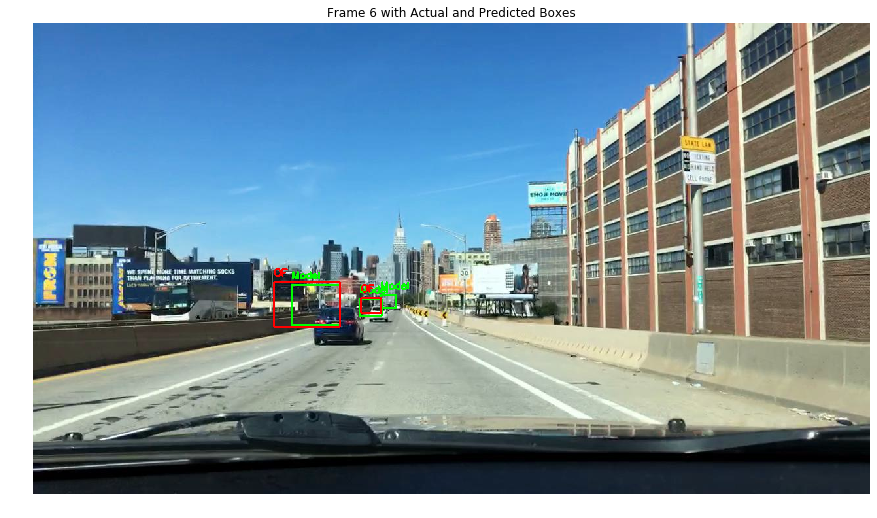

7
[array([516, 435,  34,  24], dtype=int32), array([543, 426,  24,  19], dtype=int32), array([432, 431,  74,  61], dtype=int32)]
[[516.0, 435.0, 34.0, 24.0], [543.0, 426.0, 24.0, 19.0], [432.0, 431.0, 74.0, 61.0]]
1.0


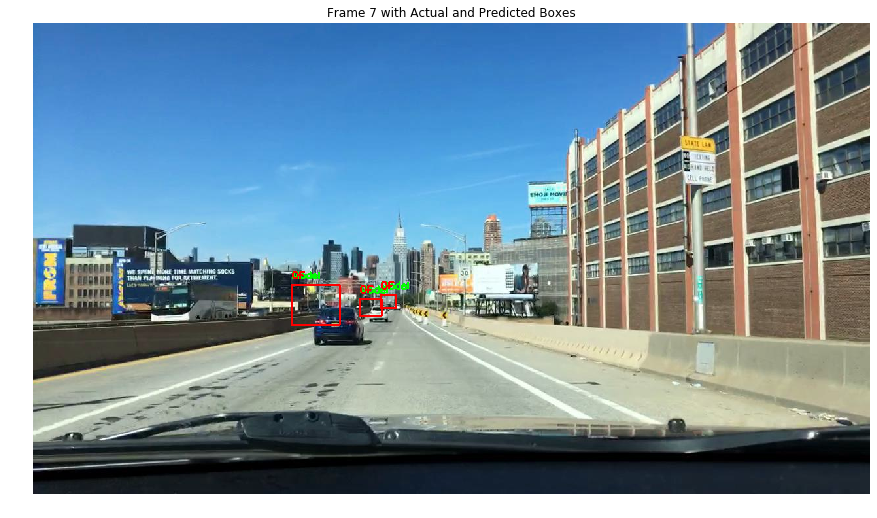

9
[array([516, 435,  34,  24], dtype=int32), array([543, 426,  24,  19], dtype=int32), array([432, 431,  74,  61], dtype=int32)]
[[516.0, 435.0, 34.0, 24.0], [543.0, 426.0, 24.0, 19.0], [432.0, 431.0, 74.0, 61.0]]
1.0


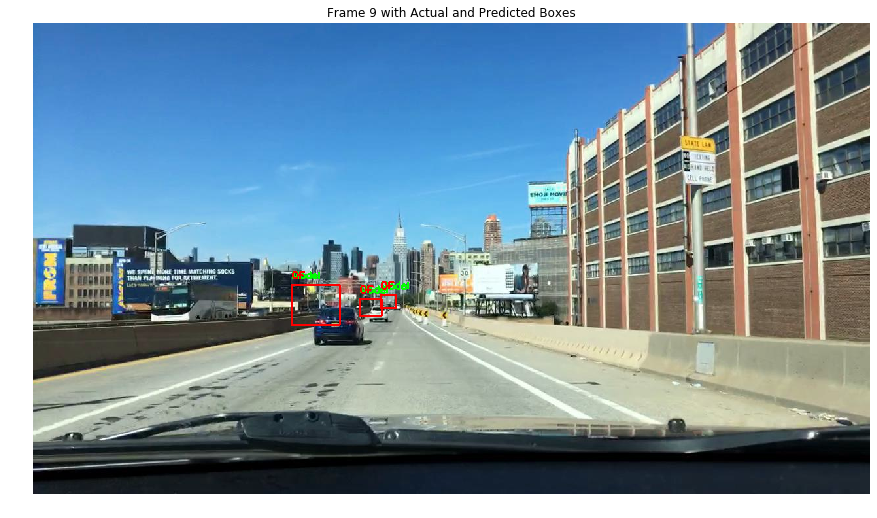

12
[array([518, 439,  34,  23], dtype=int32), array([437, 437,  73,  58], dtype=int32)]
[[518.4805755615234, 438.9989776611328, 34.955597, 23.210297], [545.0679931640625, 430.228515625, 24.317017, 18.633484], [426.4822692871094, 436.40089416503906, 95.491394, 64.31827]]
0.481847578134394


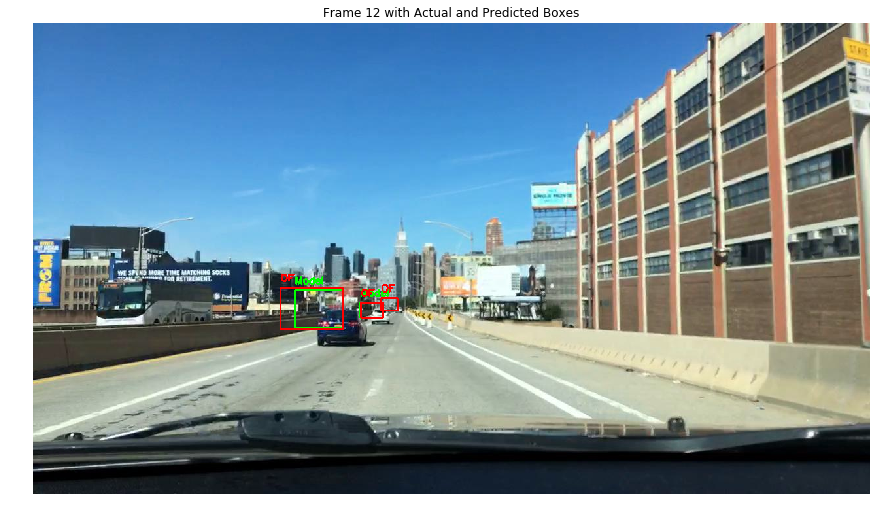

13
[array([518, 439,  34,  23], dtype=int32), array([437, 437,  73,  58], dtype=int32)]
[[518.0, 439.0, 34.0, 23.0], [437.0, 437.0, 73.0, 58.0]]
1.0


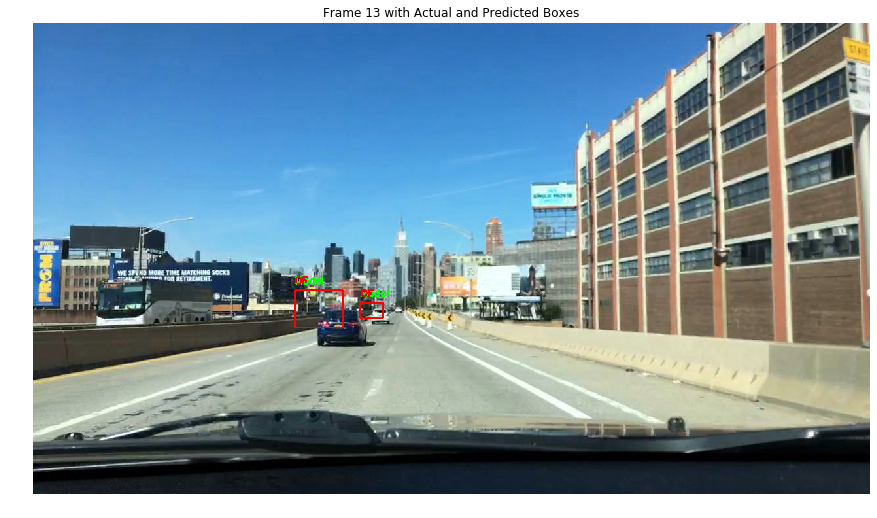

15
[array([570, 435,  27,  17], dtype=int32), array([270, 440,  41,  19], dtype=int32), array([555, 430,  23,  18], dtype=int32), array([521, 437,  32,  23], dtype=int32), array([440, 435,  77,  59], dtype=int32), array([  6, 407, 199,  55], dtype=int32)]
[[519.8406372070312, 437.76927185058594, 35.40796, 22.691193], [438.3800506591797, 435.6574401855469, 79.415375, 58.962463]]
0.0


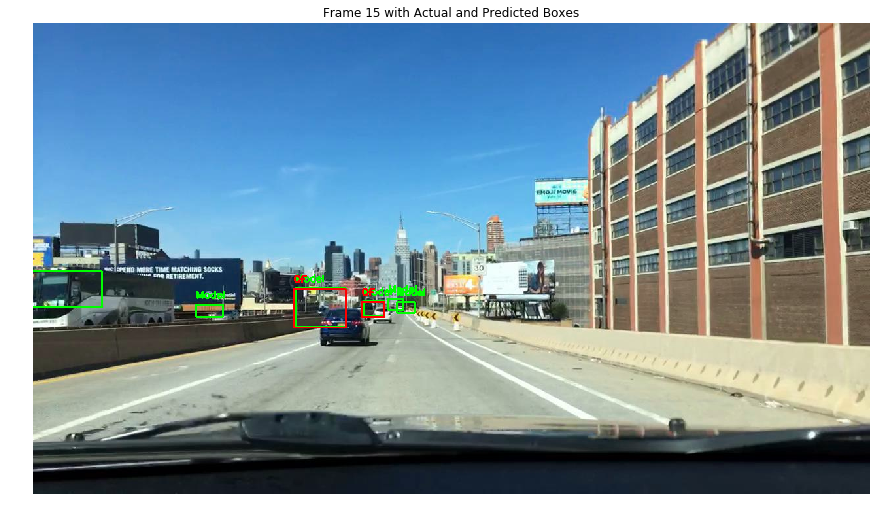

16
[array([570, 435,  27,  17], dtype=int32), array([270, 440,  41,  19], dtype=int32), array([555, 430,  23,  18], dtype=int32), array([521, 437,  32,  23], dtype=int32), array([440, 435,  77,  59], dtype=int32), array([  6, 407, 199,  55], dtype=int32)]
[[570.0, 435.0, 27.0, 17.0], [270.0, 440.0, 41.0, 19.0], [555.0, 430.0, 23.0, 18.0], [521.0, 437.0, 32.0, 23.0], [440.0, 435.0, 77.0, 59.0], [55.75, 407.0, 99.5, 55.0]]
0.9166666666666666


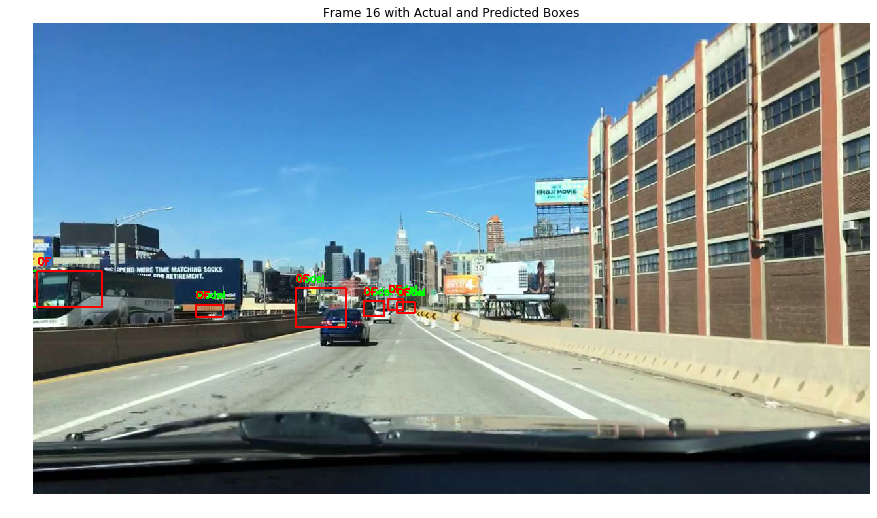

18
[array([570, 435,  27,  17], dtype=int32), array([270, 440,  41,  19], dtype=int32), array([555, 430,  23,  18], dtype=int32), array([521, 437,  32,  23], dtype=int32), array([440, 435,  77,  59], dtype=int32), array([  6, 407, 199,  55], dtype=int32)]
[[570.0, 435.0, 27.0, 17.0], [270.0, 440.0, 41.0, 19.0], [555.0, 430.0, 23.0, 18.0], [521.0, 437.0, 32.0, 23.0], [440.0, 435.0, 77.0, 59.0], [55.75, 407.0, 99.5, 55.0]]
0.9166666666666666


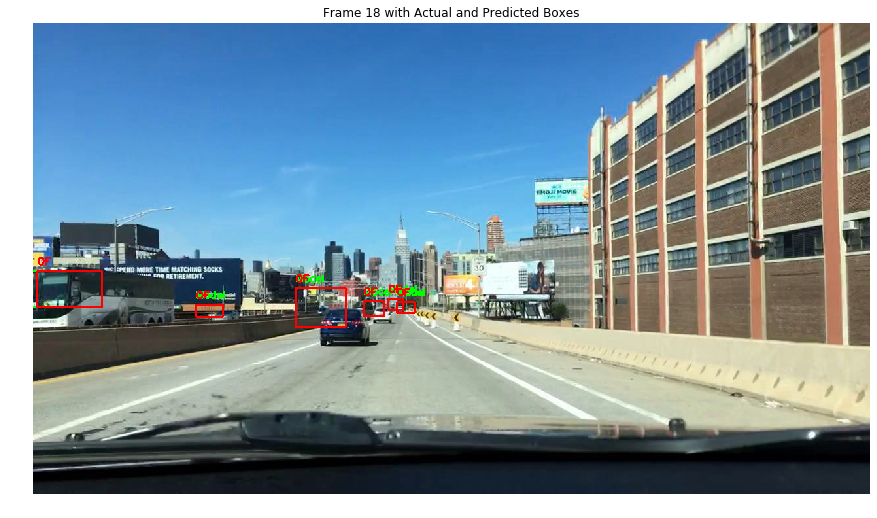

21
[array([565, 443,  39,  17], dtype=int32), array([522, 441,  32,  26], dtype=int32), array([443, 442,  79,  61], dtype=int32)]
[[570.5100708007812, 441.88194274902344, 29.616455, 17.442719], [246.40950775146484, 449.0454406738281, 48.975784, 21.380981], [554.5226440429688, 436.76918029785156, 24.284668, 18.120636], [520.3249969482422, 444.3393096923828, 34.241974, 23.500946], [438.19427490234375, 442.36444091796875, 85.87048, 61.706787], [46.5666389465332, 401.43377685546875, 96.122765, 82.01404]]
0.21594279840661793


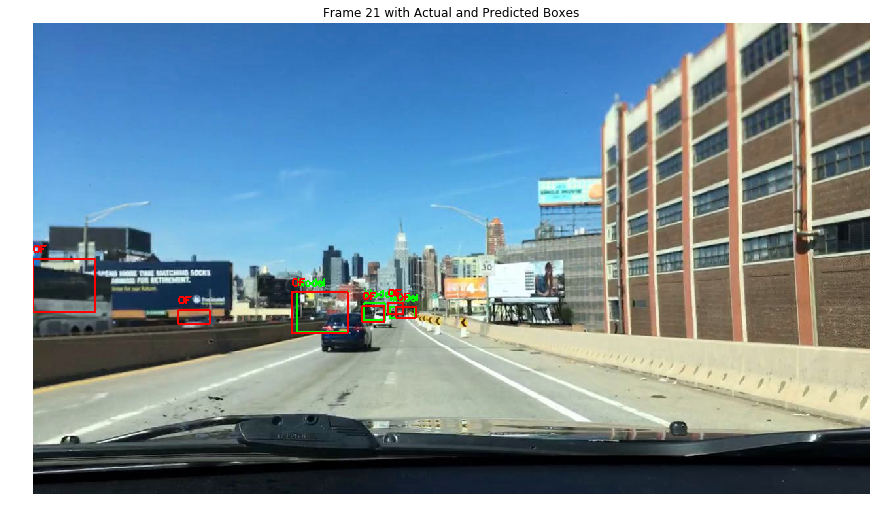

22
[array([565, 443,  39,  17], dtype=int32), array([522, 441,  32,  26], dtype=int32), array([443, 442,  79,  61], dtype=int32)]
[[565.0, 443.0, 39.0, 17.0], [522.0, 441.0, 32.0, 26.0], [443.0, 442.0, 79.0, 61.0]]
1.0


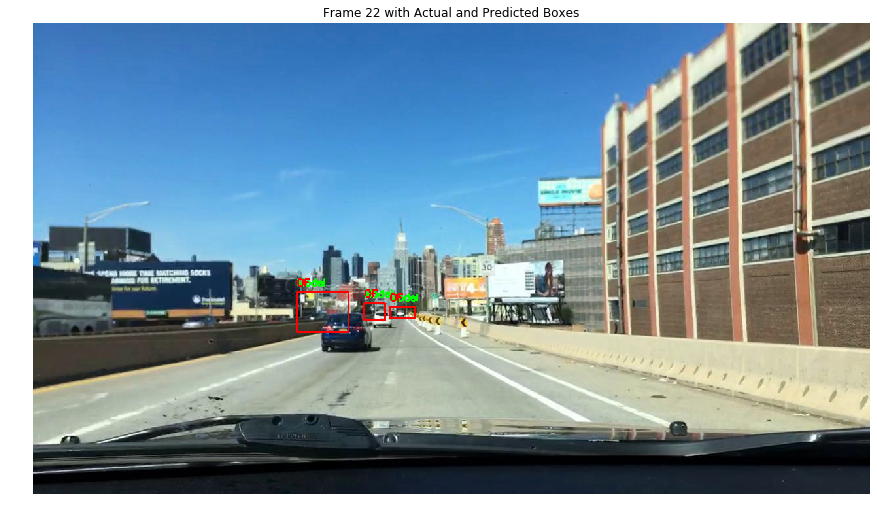

24
[array([565, 443,  39,  17], dtype=int32), array([522, 441,  32,  26], dtype=int32), array([443, 442,  79,  61], dtype=int32)]
[[565.0, 443.0, 39.0, 17.0], [522.0, 441.0, 32.0, 26.0], [443.0, 442.0, 79.0, 61.0]]
1.0


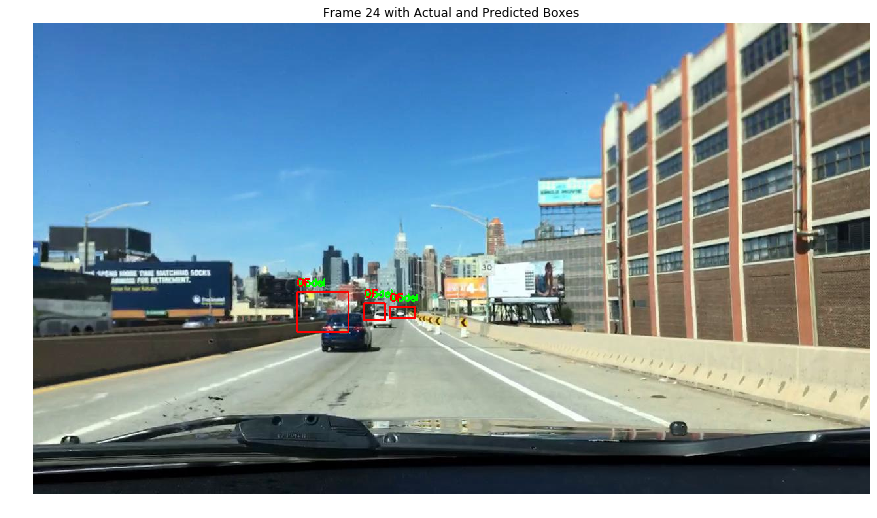

27
[array([521, 434,  31,  28], dtype=int32), array([446, 436,  80,  63], dtype=int32)]
[[566.3124694824219, 438.0140380859375, 41.034485, 17.968567], [521.9978485107422, 436.141845703125, 33.64212, 25.409912], [438.4943389892578, 438.2629852294922, 94.175995, 62.111053]]
0.0


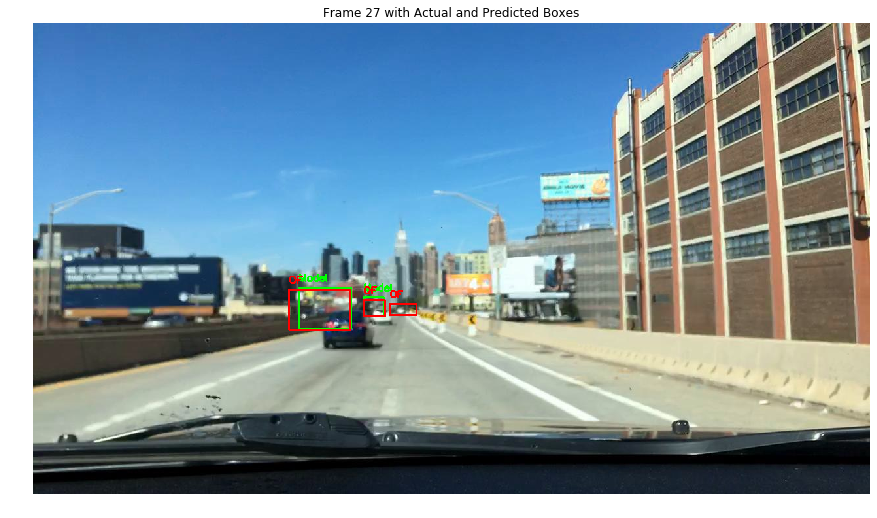

28
[array([521, 434,  31,  28], dtype=int32), array([446, 436,  80,  63], dtype=int32)]
[[521.0, 434.0, 31.0, 28.0], [446.0, 436.0, 80.0, 63.0]]
1.0


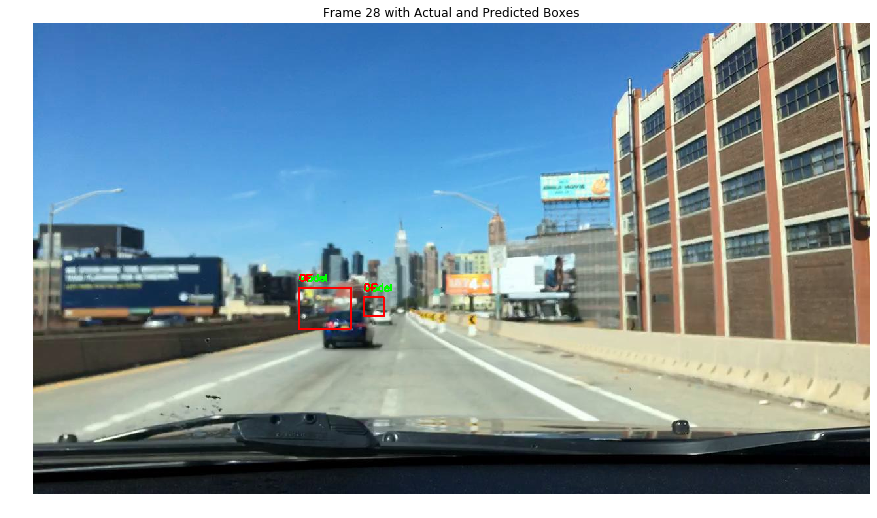

30
[array([521, 434,  31,  28], dtype=int32), array([446, 436,  80,  63], dtype=int32)]
[[521.0, 434.0, 31.0, 28.0], [446.0, 436.0, 80.0, 63.0]]
1.0


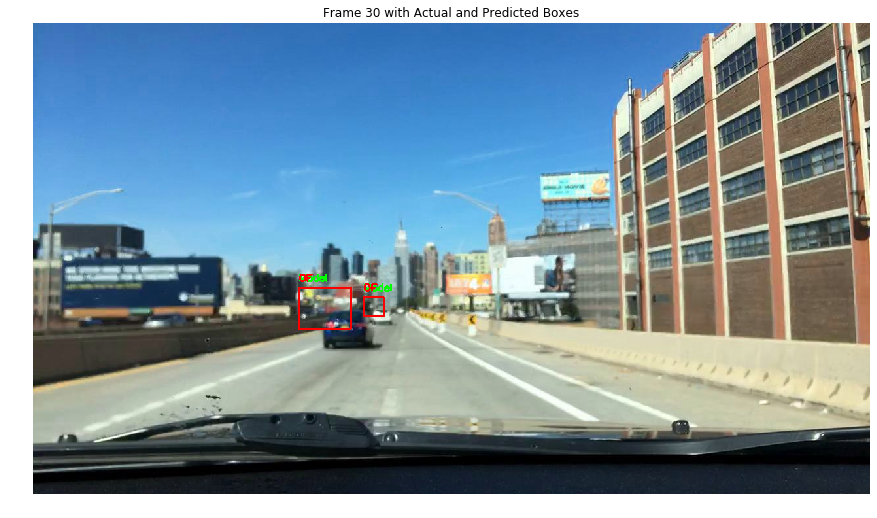

In [172]:
dummy_losses = model_vs_of(one_vid_dataset, model, criterion, device, lk_params, show_results = True)


## Testing Optical Flow Against Original Boxes

In [64]:
video = X_test_list[0]
video

'002d290d-89f4e5c0'

In [66]:
one_video_sample_df = test_df[test_df['videoName'] == video]
one_vid_dataset = DrivingDataset(image_ids=one_video_sample_df.name.values, 
                               dataframe=one_video_sample_df, 
                               transforms=get_valid_transforms())

In [61]:
frames = list(test_df[test_df['videoName'] == video]['name'].drop_duplicates())
len(frames)

201

In [62]:
frameNums = test_df[test_df['videoName'] == video]['frameIndex'].unique()
numFrames = len(frameNums)

In [44]:
ipd.Video(f'bdd100k_videos_train_00/bdd100k/videos/train/{video}.mov', width=700)

tensor(1.0000)


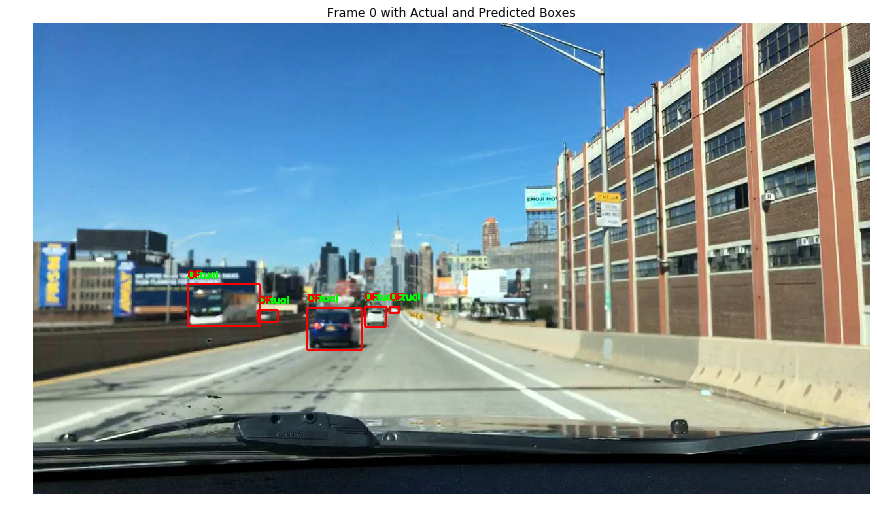

tensor(1.0000)


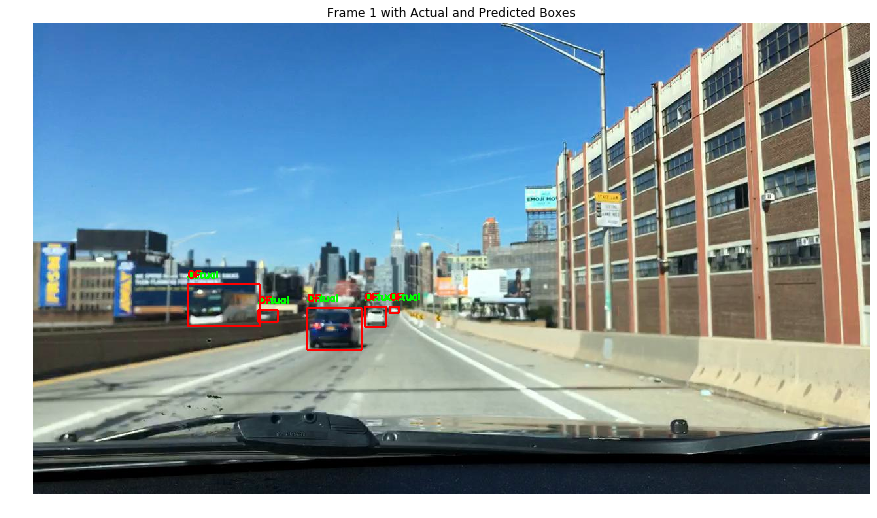

tensor(1.0000)


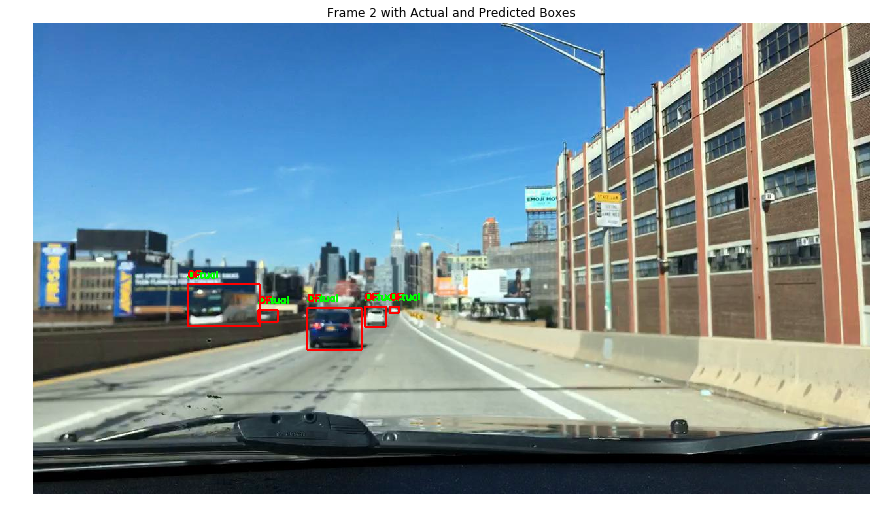

tensor(1.0000)


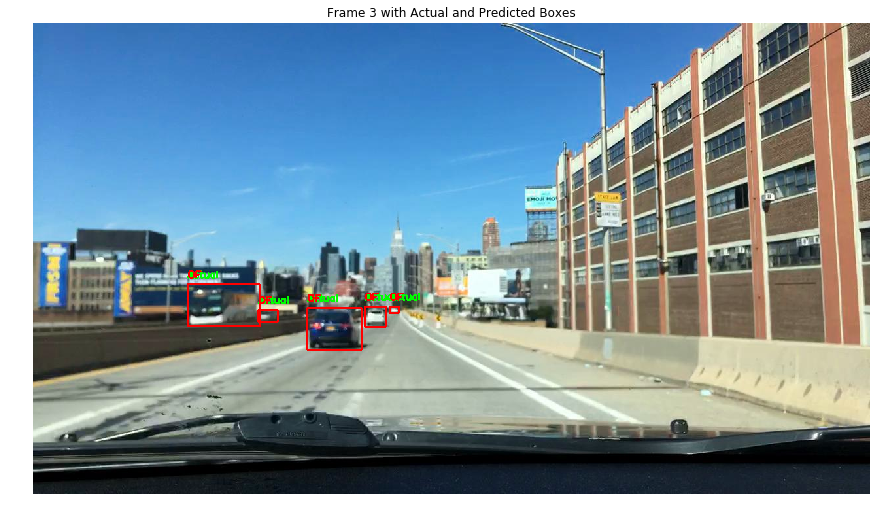

tensor(1.0000)


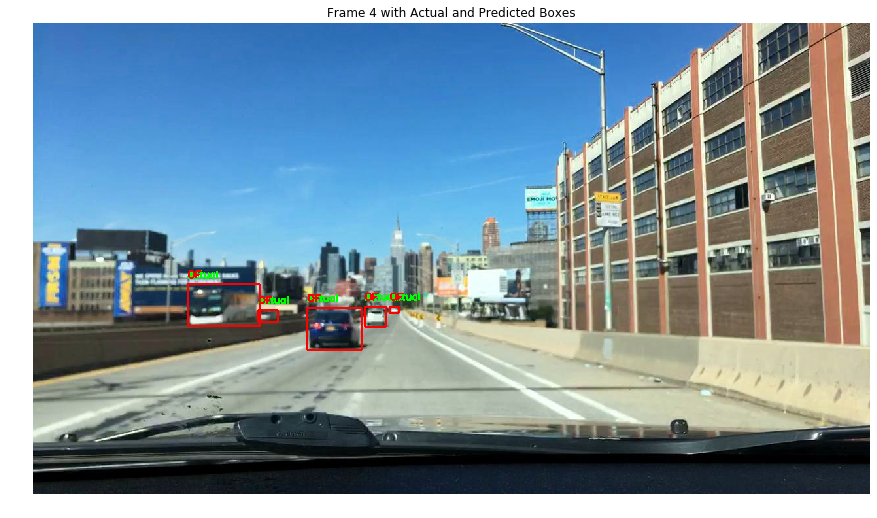

tensor(0.7678)


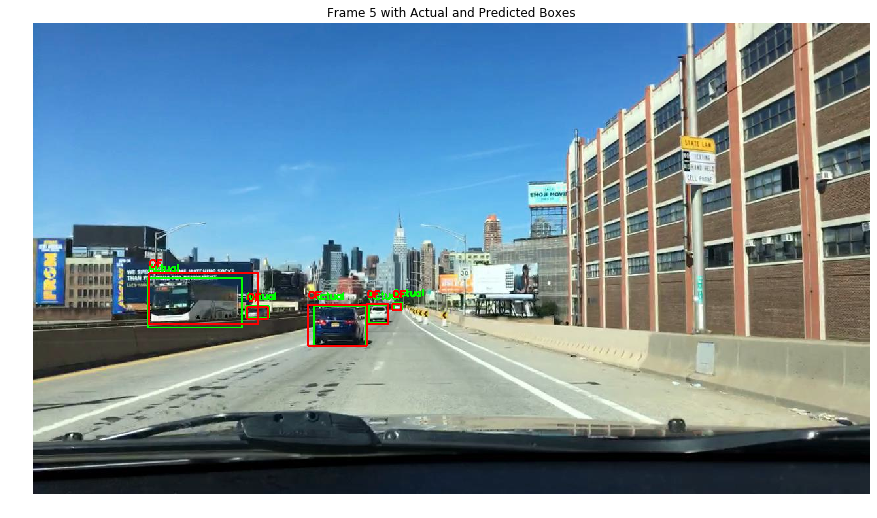

tensor(0.7678)


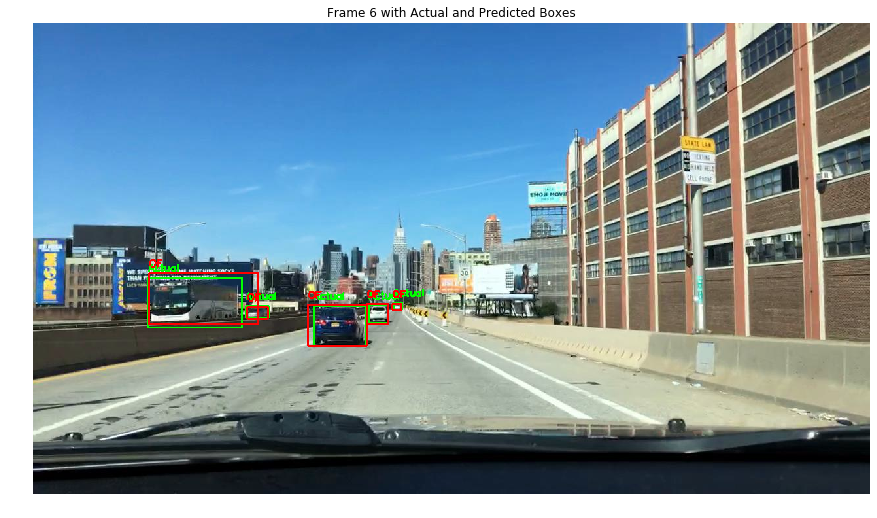

tensor(0.7678)


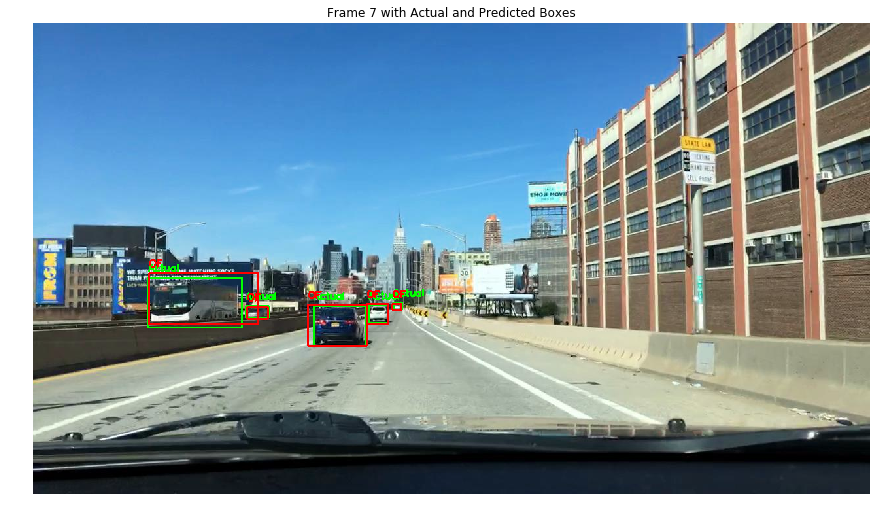

tensor(0.7678)


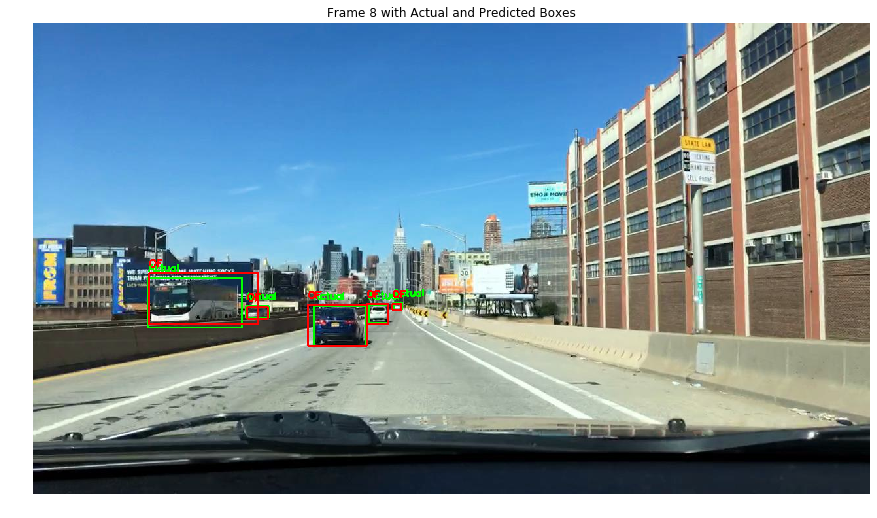

tensor(0.7678)


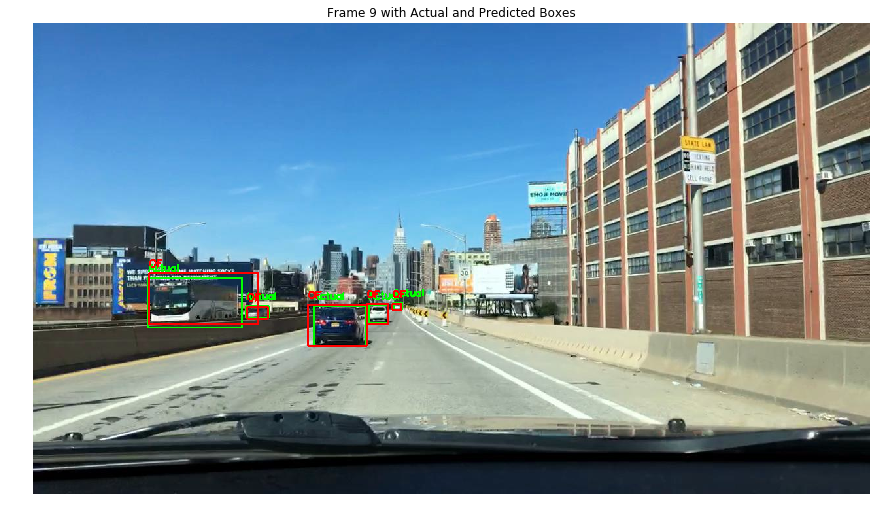

tensor(0.6769)


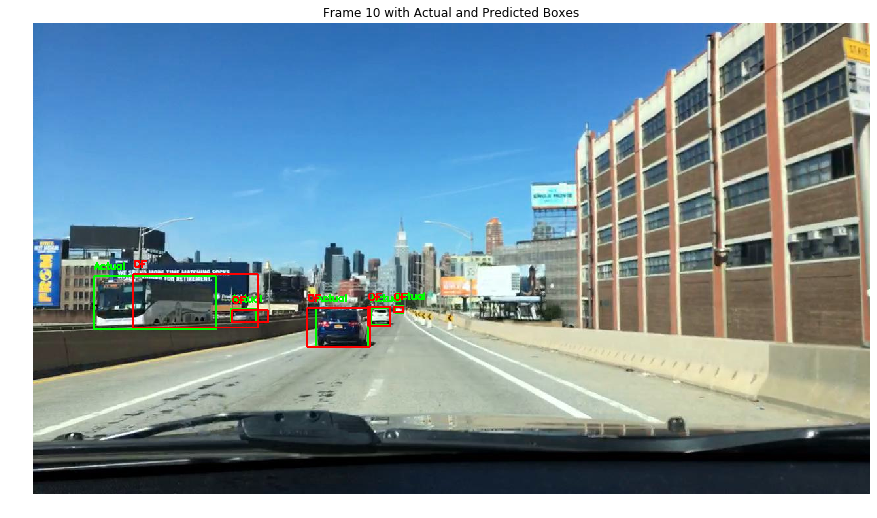

tensor(0.6769)


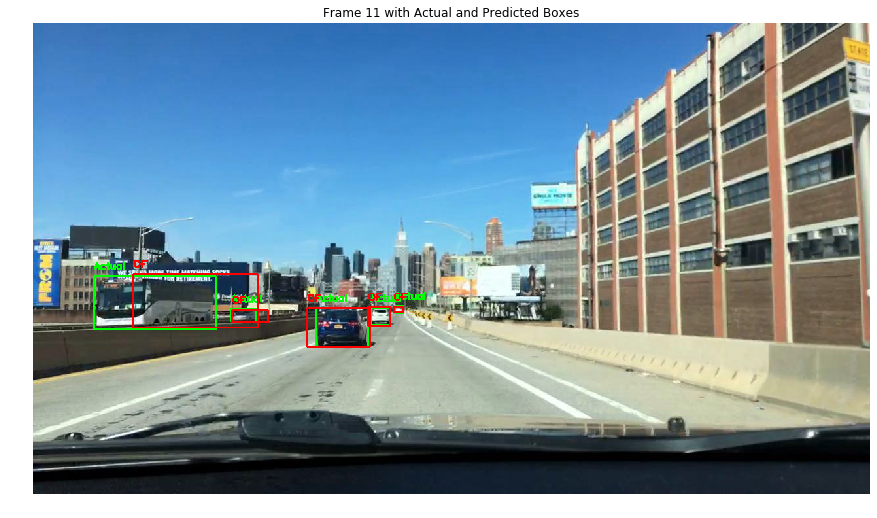

In [116]:
for idx, (image, target, image_id) in enumerate(one_vid_dataset):  # Adjust the range as needed
    if idx == 0:
        normalized_boxes = target['boxes']
        img_width, img_height = 1280, 720
        pixel_boxes = convert_normalized_boxes(normalized_boxes, img_width, img_height)
        image_np = image.numpy().transpose(1, 2, 0)  # Convert from PyTorch tensor to NumPy array and change from CxHxW to HxWxC
        image_np = (image_np * 255).astype(np.uint8)  # Convert from [0, 1] to [0, 255]
        image_bgr = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)  # Convert from RGB to BGR if needed
        prev_img = image_bgr
        prev_boxes = pixel_boxes

    # Convert the image for optical flow processing
    curr_img = image.numpy().transpose(1, 2, 0)
    curr_img = (curr_img * 255).astype(np.uint8)
    curr_img = cv2.cvtColor(curr_img, cv2.COLOR_RGB2BGR)
    
    actual_detr_boxes = target['boxes']  # Assuming these are in DETR format (center_x, center_y, w, h)
    actual_detr_boxes_non_normalized = convert_normalized_boxes(actual_detr_boxes, img_width, img_height)
    img_with_boxes = draw_boxes(curr_img.copy(), actual_detr_boxes, (0, 255, 0), "Actual")

    # Apply optical flow prediction
    loss, new_boxes = get_OF_pred(prev_boxes, prev_img, curr_img, lk_params)

    new_boxes_normalized = normalize_boxes(new_boxes, img_width, img_height)
    img_with_boxes = draw_boxes(img_with_boxes, new_boxes_normalized, (0, 0, 255), "OF")
#     img_with_boxes = draw_boxes(curr_img.copy(), new_boxes, (0, 255, 0), "OF")

    print(compare_outputs(actual_detr_boxes_non_normalized, new_boxes))
    # Update for the next iteration
    prev_img = curr_img
    prev_boxes = new_boxes

    # Visualize
    plt.figure(figsize=(15, 15))
    plt.imshow(cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB))
    plt.title(f"Frame {idx} with Actual and Predicted Boxes")
    plt.axis("off")
    plt.show()
    
    # Update for the next iteration
    prev_img = curr_img
    prev_boxes = new_boxes
    
    if idx > 10:
        break
    
    